<center>
  <h1><b>Bayesian Image Super-Resolution </b></h1>
  <br>
  07 / 03 / 2024
  <br>
  <br>
  <b>Student Name:</b> Mahdi Ranjbar - Aissa Abdelaziz
  <br>
  <br>
  </center>

[Link of the paper](https://proceedings.neurips.cc/paper_files/paper/2002/file/88bfcf02e7f554f9e9ea350b699bc6a7-Paper.pdf)

Import Packages

In [151]:
import time
import random
from tqdm.notebook import tqdm
import cv2
from PIL import Image
from matplotlib import image
import torch
import numpy as np
from matplotlib import pyplot as plt

In [152]:
#Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Functions

## General Functions

In [153]:
def load(path):
    """
    Reads an image from the specified path and performs pre-processing.

    Args:
        path (str): The path to the image file.
    Returns:
        torch.Tensor: The pre-processed image as a PyTorch tensor.
    """
    img = cv2.imread(path, 0)
    img = Image.fromarray(img)
    img = img.resize((SHAPE_HR[1], SHAPE_HR[0]), Image.ANTIALIAS) #resize the input image to desired size
    img = np.asarray(img)
    img = img.reshape(N, 1)
    img = torch.from_numpy(img.copy()).to(device)
    img = img.float()
    img = scale(img)

    return img

In [154]:
def disp(img):
    """
    Displays an image using Matplotlib

    Args:
        img (torch.Tensor or numpy.ndarray): The image data to be displayed.
    """
    if type(img) == torch.Tensor:
        if img.is_cuda:
            img = img.data.cpu().numpy()
        else:
            img = img.numpy()

    plt.imshow(img, cmap = "gray")
    plt.axis("off")
    plt.tight_layout()

    plt.show()

In [155]:
def scale(img):
    """
    Scales the input image tensor to the range [-0.5, 0.5].

    Args:
        img (torch.Tensor): The input image tensor.

    Returns:
        torch.Tensor: The scaled image tensor.
    """
    img_s = (img - torch.min(img)) / (torch.max(img) - torch.min(img)) # scale to [0, 1]
    img_s = img_s - 0.5 # Scale to [-0.5, 0.5]
    img_s = img_s.float()
    return img_s

""" Faster logdet """
logdetSPD = lambda X : 2*torch.cholesky(X, upper = False).diagonal(dim1 = -2, dim2 = -1).log().sum(-1)

In [157]:
def getPatch(img, shape, shape_orig, cx, cy):
    """
    Retrieves a patch of specified shape centered at (center_x, center_y) from the input image.

    Args:
        image (numpy.ndarray): The input image.
        patch_shape (tuple): The shape of the patch to be extracted (height, width).
        original_shape (tuple): The original shape of the image (height, width).
        center_x (int): The x-coordinate of the center of the patch.
        center_y (int): The y-coordinate of the center of the patch.

    Returns:
        numpy.ndarray: The extracted patch reshaped as a column vector.
    """
    x_start = cx - shape[0]//2
    x_end   = x_start + shape[0]
    y_start = cy - shape[1]//2
    y_end   = y_start + shape[1]
    patch = img.reshape(shape_orig)
    patch = patch[x_start:x_end, y_start:y_end]
    patch = patch.reshape(-1, 1)
    return patch

In [ ]:
def positions(shape):
    """
    Returns a 2 x N coordinate tensor representing the positions of pixels in an image of given shape.

    Args:
        shape (tuple): The shape of the image (height, width).

    Returns:
        torch.Tensor: The 2 x N coordinate tensor.
    """
    v = np.indices(shape)
    v = v.reshape(2, -1)
    v = torch.from_numpy(v)
    v = v.float().to(device)
    return v

In [399]:
def display_image_grid(images,shape, rows, cols, figsize=(10, 10)):
    """
    Display a grid of images.

    Args:
        images (list): List of torch.Tensor images.
        shape (tuple): Shape of the images (height, width).
        rows (int): Number of rows in the grid.
        cols (int): Number of columns in the grid.
        figsize (tuple, optional): Figure size. Defaults to (10, 10).
    """

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
      image_np = images[i].cpu().numpy()
      ax.imshow(image_np.reshape(shape), cmap='gray')
      ax.axis('off')
    plt.show()

Evaluation Score

In [459]:
def RMSE(x1, x2):
    """
    Computes the Root Mean Squared Error (RMSE) between two images.

    Args:
        image1 (torch.Tensor): The first image.
        image2 (torch.Tensor): The second image.

    Returns:
        torch.Tensor: The RMSE value.
    """

    mse = torch.mean((x1 - x2) ** 2)
    return torch.sqrt(mse)

In [402]:
def PSNR(x1, x2):
    """
    Computes the Peak Signal-to-Noise Ratio (PSNR) between two images.

    Args:
        image1 (torch.Tensor): The first image.
        image2 (torch.Tensor): The second image.

    Returns:
        torch.Tensor: The PSNR value.
    """
    x1 = scale(x1)
    x2 = scale(x2)
    mse = torch.mean((x1 - x2) ** 2)
    return 10 * torch.log10(1 / mse)

Hyper Parameters of the Observation Model

In [403]:
UPSCALE_FACTOR = 4
K = 16
SIGMA_AGN = 0.02 #standard deviation
SHAPE_HR_ORG = [150, 150] # High resolution Shape
SHAPE_HR = SHAPE_HR_ORG
SHAPE_PATCH_HR = [50, 50] # High resolion patch shape
SHAPE_LR_ORG = [dim//UPSCALE_FACTOR for dim in SHAPE_HR]
SHAPE_LR = SHAPE_LR_ORG
SHAPE_PATCH_LR = [dim//UPSCALE_FACTOR for dim in SHAPE_PATCH_HR]
N = SHAPE_HR[0] * SHAPE_HR[1] #Number of pixel in HR images
M = SHAPE_LR[0] * SHAPE_LR[1] #Number of pixel in LR images
CENTER_HR = [dim//2 for dim in SHAPE_HR] #The center of rotaiton
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(device)
# Compute v to be used in the next cells
V_HR  = positions(SHAPE_HR) #for high resolution
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # the square of v
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR) #for low resolution

## Observation Model as Described in The Paper

$$
\mathbf{R}_k =
\begin{pmatrix}
\cos(\theta_k) & \sin(\theta_k) \\
-\sin(\theta_k) & \cos(\theta_k)
\end{pmatrix}$$

In [404]:
def getRotationMatrix(theta): # involves theta
    """
    Returns a 2x2 rotation matrix. Theta is assumed to be in degrees.

    Args:
        theta (float): The angle of rotation in degrees.

    Returns:
        torch.Tensor: The 2x2 rotation matrix.
    """
    theta_rad = (np.pi / 180) * theta # To radians
    R = torch.empty(2, 2, dtype = torch.float).to(device)
    R[0, 0] = torch.cos(theta_rad)
    R[0, 1] = torch.sin(theta_rad)
    R[1, 0] = -torch.sin(theta_rad)
    R[1, 1] = torch.cos(theta_rad)
    return R

$$U_{j}^{(k)} = R^{(k)} (v_{j} - \bar{v}) + \bar{v} + S_{k}$$


In [405]:
def shiftAndRotate(shape, R, s): # involves theta
    """
    Computes the transformed coordinates u_j.

    Args:
        shape (tuple): The shape of the image (height, width).
        rotation_matrix (torch.Tensor): The 2x2 rotation matrix.
        shift_vector (torch.Tensor): The shift vector.

    Returns:
        torch.Tensor: The transformed coordinates.
    """
    u = torch.mm(R, (V_LR - CENTER_HR)) + CENTER_HR + s
    return u


$$\widetilde{W}_{ij} = \exp \left( -\frac{\| v_j - u_i \|^2}{\gamma^2} \right).......(1)
$$

$$W_{ij} = \frac{\widetilde{W}_{ij}}{\sum_{j=1}^{N} \widetilde{W}_{ij}} .......(2)
$$

In [406]:
def transform(s, theta, gamma):
    """
    Computes the matrix Wij.

    Args:
        s (torch.Tensor): The shift vector.
        theta (float): The angle of rotation in degrees.
        gamma (float): The scale parameter.

    Returns:
        torch.Tensor: The transformation matrix W.
    """
    #Equation (1)
    R = getRotationMatrix(theta) #Return the rotation matrix
    u = shiftAndRotate(SHAPE_LR, R, s)
    dist_sq = 2*torch.mm(u.t(), V_HR)
    u2 = torch.sum(u**2, axis = 0).reshape(-1, 1)
    dist_sq = (dist_sq - V_HR2 - u2)
    W = torch.exp((1 / (gamma ** 2)) * dist_sq)
    #Equation (2)
    scale = torch.sum(W, dim = 1).reshape(-1, 1)
    W = W / scale

    return W

# Generate K Low Resolution Images from the input High Resolution Image

$$
y_k = W_k x + \epsilon_k
$$

$$
\epsilon \sim \mathcal{N}(0, \beta^{-1})
$$

In [407]:
#generate one low resolution image
def synthLRSingle(img, sigma, s , theta, gamma):
    """
    Synthesizes a low-resolution image based on the input image and parameters.

    Args:
        img (torch.Tensor): The high-resolution input image.
        sigma (float): The standard deviation of additive Gaussian noise.
        s (torch.Tensor): The shift vector.
        theta (float): The angle of rotation in degrees.
        gamma (float): The scale parameter.

    Returns:
        torch.Tensor: The synthesized low-resolution image.
    """

    W_k = transform(s, theta, gamma)
    eps = sigma * torch.randn(M, 1).to(device) # Additive Gaussian Noise
    img_lr = torch.mm(W_k, img) + eps

    img_lr = scale(img_lr)

    return img_lr

In [408]:
#return a random shift values tensor
def getRandomShifts(a, b):
    """ Returns a Kx2x1 tensor randomly initialized using values between a and b """
    s = (b - a)*np.random.rand(K, 2, 1) + a
    s = s.tolist()
    s = [torch.tensor(s_i, dtype = torch.float).to(device) for s_i in s]
    return s

#return a random Angles values tensor
def getRandomAngles(a, b):
    """ Returns a Kx1 tensor randomly initialized using values between a and b """
    theta = (b - a)*np.random.rand(K, 1) + a
    theta = theta.tolist()
    theta = [torch.tensor(theta_i, dtype = torch.float).to(device) for theta_i in theta]
    return theta


#generate K low resolution image
def synthLRMultiple(img, sigma, s_list = None, theta_list = None, gamma = None):
    """
    Synthesizes a list of K low-resolution images based on the input image and parameters.

    Args:
        img (torch.Tensor): The high-resolution input image.
        sigma (float): The standard deviation of additive Gaussian noise.

    Returns:
        list: A list of synthesized low-resolution images.
        list: A list of shift vectors used for creating the low-resolution images.
        list: A list of rotation angles used for creating the low-resolution images.
    """
    s_list = getRandomShifts(-2, 2)
    theta_list = getRandomAngles(-4, 4)
    gamma = 2
    y = [synthLRSingle(img, sigma, s_list[k], theta_list[k], gamma) for k in range(K)]

    return y, s_list, theta_list

# Define Bayesian Framework

## Prior

### Gaussian Prior
$$
p(x) = \mathcal{N}(x; \boldsymbol{\mu}_0, \mathbf{Z}_x)
$$
Where
$$
Z_x(i, j) = A \cdot \exp \left( - \frac{ \|\mathbf{v}_i - \mathbf{v}_j\|^2}{r^2} \right)
$$

Log Gaussian Prior :
$$
\log p(x) = -\frac{1}{2} \log(2\pi) - \frac{1}{2} \log \det(\mathbf{Z}_x) - \frac{1}{2} (\mathbf{x} - \boldsymbol{\mu}_0)^T \mathbf{Z}_x^{-1} (\mathbf{x} - \boldsymbol{\mu}_0)
$$

In [409]:
def priorCovariance():
    """
    Computes the prior covariance matrix Z_x as specified in the paper.

    Returns:
        torch.Tensor: The NxN prior covariance matrix.
    """
    # Define parameters
    r = 1  # correlation length
    A = 0.04     # strength of the prior
    dist_sq = 2*torch.mm(V_HR.t(), V_HR) - V_HR2.reshape(1, -1) - V_HR2.reshape(-1, 1)

    global Zx
    Zx = A * torch.exp((1 / r ** 2) * dist_sq)

In [410]:
def logPriorGaussian(x):
    """
    Computes the log prior of a Gaussian distribution.

    Args:
        x (torch.Tensor): The input vector.

    Returns:
        torch.Tensor: The log prior.
    """
    term1 = N * logdet_Zx
    term2 = torch.mm(x.t(), Zx_inv)
    term2 = torch.mm(term2, x)
    log_prior = -0.5 * (term1 + term2)
    return log_prior

# MRF Prioir

In [ ]:
# Likelihood weight and the huber penalty hyperparameters
BETA = 0.005
HUBER_GAMMA = 0.055
def huber(d, h):
    """ The standard huber penalty """
    abs_d  = torch.abs(d)
    mask_1 = abs_d <= h
    mask_2 = abs_d > h
    penalty = torch.zeros(d.size(), dtype = torch.float).to(device)
    penalty[mask_1] = 0.5 * (abs_d[mask_1] ** 2)
    penalty[mask_2] = (h * abs_d[mask_2]) - 0.5*(h**2)
    return penalty
def neighbours(x):
    """ Computes the pixel-neighbour differences using a 4-neighbourhood system """

    x_2d = x.reshape(SHAPE_HR)

    x_t = torch.roll(x_2d, 1, 0)
    x_b = torch.roll(x_2d, -1, 0)
    x_l = torch.roll(x_2d, 1, 1)
    x_r = torch.roll(x_2d, -1, 1)

    d_t = x_2d - x_t
    d_b = x_2d - x_b
    d_l = x_2d - x_l
    d_r = x_2d - x_r

    return d_t, d_b, d_l, d_r
def logPriorMRF(x):
    """ Returns the log prior """
    d_t, d_b, d_l, d_r = neighbours(x)
    log_prior = -0.5 * torch.sum(huber(d_t, HUBER_GAMMA) + huber(d_b, HUBER_GAMMA) + huber(d_l, HUBER_GAMMA) + huber(d_r, HUBER_GAMMA))
    return log_prior

In [ ]:
def logPosteriorMRF(x, y, W, sigma):
    """
    Computes the log posterior with Markov Random Field (MRF) prior.

    Args:
        x (torch.Tensor): The input vector.
        y (list of torch.Tensor): observed low-resolution images.
        W (list of torch.Tensor): transformation matrices.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The log posterior.
    """
    log_posterior = (1 - BETA)*logPriorMRF(x) + BETA*logLikelihood(x, y, W, sigma)
    return log_posterior

## Likelihood

$$
p(y_{kj} | x; s_k; \theta_k; \gamma) = \left( \frac{\beta}{2\pi} \right)^{M/2} \exp \left( -\frac{\beta}{2} \| y_{kj} - W_k x_k \|^2 \right)
$$

$$
L = \sum_{k=1}^{K} p(y_{kj} | x; s_k; \theta_k; \gamma)
$$

Log likelihood:


$$
log L = \underbrace{
    \begin{array}{c}
    \frac{KM}{2} \log\left(\frac{\beta}{2\pi}\right)
    \end{array}
}_{\text{First term}}
- \underbrace{
    \begin{array}{c}
    \frac{\beta}{2} \sum_{k=1}^{K} \left\| y_{kj} - W_k x_k \right\|^2
    \end{array}
}_{\text{Second term}}
\
$$

In [411]:
def likelihoodMean(y, W):
    """
    Computes the likelihood.

    Args:
        y (list of torch.Tensor): observed low-resolution images.
        W (list of torch.Tensor): transformation matrices.

    Returns:
        torch.Tensor: The mean of the resultant Gaussian.
    """

    term1 = torch.zeros(N, N, dtype = torch.float).to(device)
    term2 = torch.zeros(N, 1, dtype = torch.float).to(device)

    for k in range(K):
        term1 = term1 + torch.mm(W[k].t(), W[k])
        term2 = term2 + torch.mm(W[k].t(), y[k])

    mu_likelihood = torch.mm(torch.inverse(term1), term2)

    return mu_likelihood

In [412]:
def logLikelihood(x, y, W, sigma):
    """
    Computes the log likelihood.

    Args:
        x (torch.Tensor): HR image.
        y (list of torch.Tensor): low-resolution images.
        W (list of torch.Tensor): transformation matrix.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The log likelihood.
    """

    term1 = (2*K*M) * np.log(sigma)

    term2 = torch.tensor(0, dtype = torch.float).to(device)
    for k in range(K):
        Wx = torch.mm(W[k], x)
        term2 = term2 + torch.sum((y[k] - Wx)**2)
    term2 = (1 / (sigma**2)) * term2

    log_likelihood = -0.5 * (term1 + term2)

    return log_likelihood

## Posterior distribution over the high resolution image

$$
p(x \mid (y^k; s_k; \theta_k); \gamma) = \frac{p(x) \prod_{k=1}^{K} p\left( y^k \mid x; s_k; \theta_k; \gamma\right)}{p(y^k \mid s_k; \theta_k; \gamma)} = \mathcal{N}(\mu, \Sigma)
$$
$$
\Sigma = (Z_x^{-1} + \beta \sum_{k=1}^{K} (W_k^T W_k))^{-1}
$$
$$
\boldsymbol{\mu} = \beta \Sigma \left( \sum_{k=1}^{K} \mathbf{W}_k^T \mathbf{y}_k \right)
$$

### Using Gaussian Prior:

In [413]:
def posteriorCovariance(W, sigma):
    """
    Computes the covariance of the Gaussian formed by the posterior.

    Args:
        W (list of torch.Tensor): List of transformation matrices.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The posterior covariance matrix.
    """

    temp = torch.zeros(N, N, dtype = torch.float).to(device)
    for k in range(K):
        temp += torch.mm(W[k].t(), W[k])

    C = torch.inverse(Zx_inv + ((1 / sigma**2) * temp)).float()

    return C

def posteriorMean(y, C, W, sigma):
    """
    Computes the mean of the Gaussian formed by the posterior.

    Args:
        y (list of torch.Tensor): List of observed low-resolution images.
        C (torch.Tensor): The posterior covariance matrix.
        W (list of torch.Tensor): List of transformation matrices.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The posterior mean.
    """

    temp = torch.zeros(N, 1, dtype = torch.float).to(device)
    for k in range(K):
        temp += torch.mm(W[k].t(), y[k])

    mu = (1/sigma**2) * torch.mm(C, temp)

    return mu

In [414]:
def logPosteriorGaussian(x, y, W, sigma):
    """
    Computes the log posterior of a Gaussian distribution.

    Args:
        x (torch.Tensor): The input vector.
        y (list of torch.Tensor): List of observed low-resolution images.
        W (list of torch.Tensor): List of transformation matrices.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The log posterior.
    """
    log_posterior = logPriorGaussian(x) + logLikelihood(x, y, W, sigma)
    return log_posterior

## Marginal Log Likelihood

$$
\log p(y | \{ \mathbf{s}_k, \boldsymbol{\theta}_k \}, \gamma) = -\frac{1}{2} [\beta \sum_{k=1}^{K} \| \mathbf{y}_k - \mathbf{W}_k \boldsymbol{\mu} \|^2 + \boldsymbol{\mu}^T \mathbf{Z}_x^{-1} \boldsymbol{\mu} + \log (\det (\mathbf{Z}_x)) - \log (\det (\boldsymbol{\Sigma})) - KM \log (\beta)]
$$

In [415]:
def marginalLogLikelihood(y, W, C, mu, sigma):
    """
    Computes the marginal likelihood using the Gaussian prior.

    Args:
        y (list of torch.Tensor): observed low-resolution images.
        W (list of torch.Tensor): transformation matrix.
        C (torch.Tensor): The posterior covariance matrix.
        mu (torch.Tensor): The posterior mean.
        sigma (float): The standard deviation of the noise.

    Returns:
        torch.Tensor: The marginal log likelihood.
    """

    term1 = torch.tensor(0, dtype = torch.float).to(device)
    for k in range(K):
        Wmu = torch.mm(W[k], mu)
        term1 += torch.sum((y[k] - Wmu)**2)
    term1 = (1 / (sigma**2)) * term1

    term2 = torch.mm(Zx_inv, mu)
    term2 = torch.mm(mu.t(), term2)

    mll = -0.5 * (term1 + term2 - logdetSPD(C) + logdet_Zx + 2*K*M*np.log(sigma)) # logdet takes the most time

    return mll

# Starting ...

Import the input image

<ipython-input-153-47ab23a8908a>:5: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((SHAPE_HR[1], SHAPE_HR[0]), Image.ANTIALIAS)


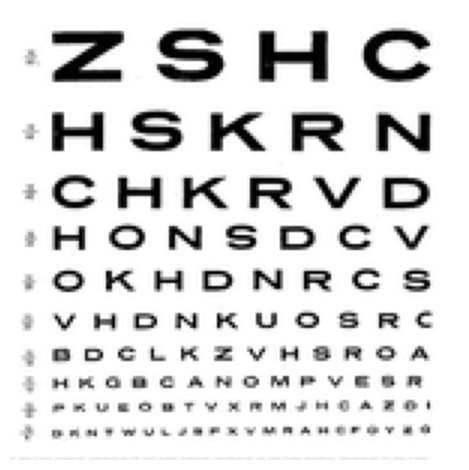

In [416]:
PATH_IMG="/content/eyechart.jpg"
img = load(PATH_IMG)
disp(img.reshape(SHAPE_HR), "hr.jpg")

# Generate the list of K Low Resolution Images

In [417]:
# Get the list of LR images
y, shifts_true, angles_true = synthLRMultiple(img, SIGMA_AGN)
gamma_true = 2

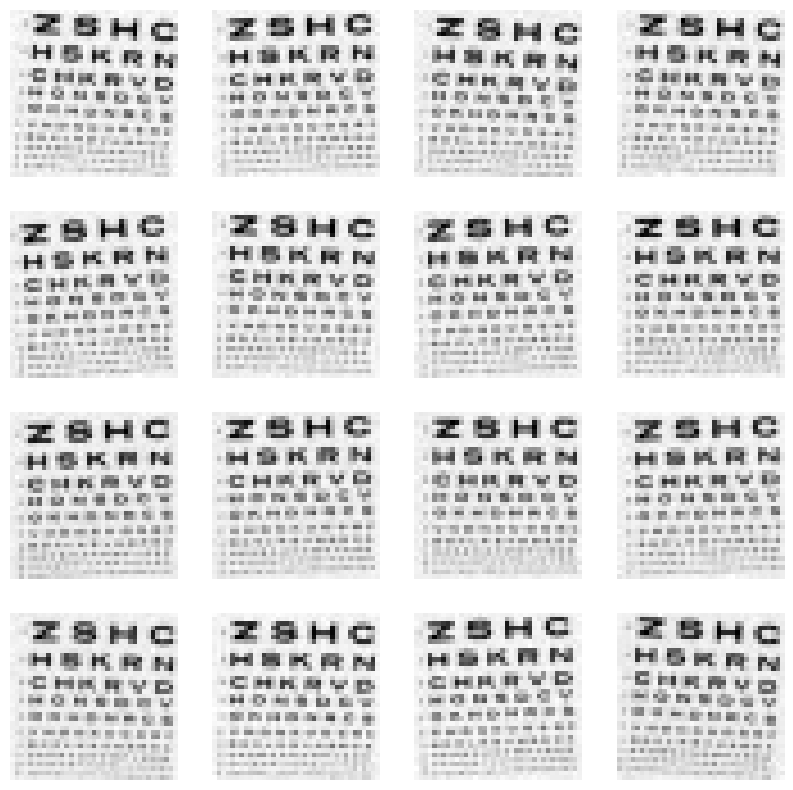

In [418]:
#Dsipaly the generated low resolution images
display_image_grid(y,SHAPE_LR, rows=4, cols=4)

### Generate a patch to be used for optimizing the marginal likelihood over the parameters

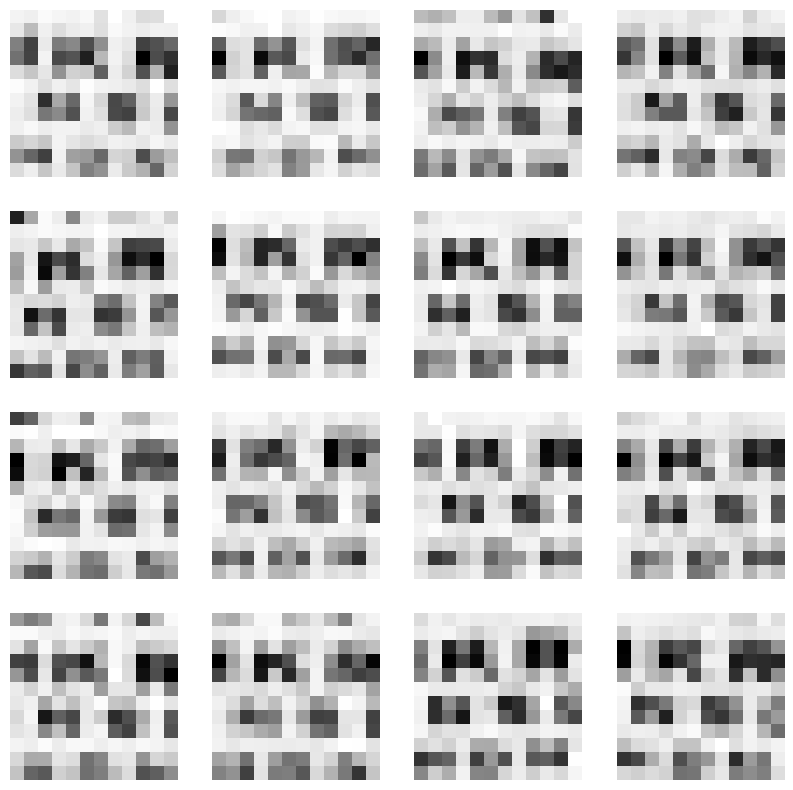

In [422]:
#generate patche
y_patches = [getPatch(y[k], SHAPE_PATCH_LR, SHAPE_LR, SHAPE_LR[0]//2, SHAPE_LR[1]//2) for k in range(K)]
display_image_grid(y_patches,SHAPE_PATCH_LR,rows=4, cols=4)

In [424]:
torch.cuda.empty_cache()

### Registration Parameters Estimation

In [425]:
SHAPE_HR = SHAPE_PATCH_HR
SHAPE_LR = SHAPE_PATCH_LR

N = SHAPE_HR[0] * SHAPE_HR[1]
M = SHAPE_LR[0] * SHAPE_LR[1]

CENTER_HR = [dim//2 for dim in SHAPE_HR]
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(device)

# Pre-compute v_hr for reuse
V_HR  = positions(SHAPE_HR)
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR)
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # [1, N]

In [426]:
# Calcualte Zx
Zx = torch.empty(N, N, dtype = torch.float).to(device)
priorCovariance()
Zx_inv = torch.inverse(Zx)
logdet_Zx = logdetSPD(Zx)
del Zx
torch.cuda.empty_cache()

#### Optimization

In [428]:
#Setup gradient over the registration parameters to be estimated

shifts = np.zeros((K, 2, 1)) # [K, 2, 1]
shifts = shifts.tolist()
shifts = [torch.tensor(s, dtype = torch.float).to(device) for s in shifts]

angles = np.zeros((K, 1))
angles = angles.tolist()
angles = [torch.tensor(theta, dtype = torch.float).to(device) for theta in angles]

gamma = torch.tensor(UPSCALE_FACTOR, dtype = torch.float).to(device)
gamma.requires_grad  = True

params = [gamma]

for k in range(K):

    shifts[k].requires_grad = True
    params.append(shifts[k])

    angles[k].requires_grad = True
    params.append(angles[k])

In [431]:
#Hyper paramters
N_EPOCH_MAX = 60 #Number of epochs
LR = 0.05  #Learning rate
#Adam optimizer
optimizer = torch.optim.Adam(
    params,
    lr = LR
)

In [433]:
#training loop
losses = []
for i in tqdm(range(N_EPOCH_MAX)):

    optimizer.zero_grad()

    W = [transform(shifts[k], angles[k], gamma) for k in range(K)]
    C  = posteriorCovariance(W, SIGMA_AGN)
    mu = posteriorMean(y_patches, C, W, SIGMA_AGN)

    torch.cuda.empty_cache()

    loss = -1*marginalLogLikelihood(y_patches, W, C, mu, SIGMA_AGN)
    loss.backward()

    torch.cuda.empty_cache()
    optimizer.step()

    loss_scalar = loss.item()
    losses.append(loss_scalar)
    print(f"Loss: {loss_scalar:.4f}")

    torch.cuda.empty_cache()

  0%|          | 0/60 [00:00<?, ?it/s]

Loss: 40224.3008
Loss: 38628.5547
Loss: 36932.3281
Loss: 35119.8320
Loss: 33189.6133
Loss: 31157.7461
Loss: 29055.8945
Loss: 26924.7852
Loss: 24805.8242
Loss: 22734.7266
Loss: 20738.0469
Loss: 18832.1094
Loss: 17025.2266
Loss: 15321.0078
Loss: 13721.0078
Loss: 12225.7031
Loss: 10834.5781
Loss: 9545.9727
Loss: 8356.8789
Loss: 7262.9385
Loss: 6258.4736
Loss: 5336.6064
Loss: 4489.6533
Loss: 3709.5010
Loss: 2988.1592
Loss: 2318.2549
Loss: 1693.2725
Loss: 1107.9355
Loss: 558.1357
Loss: 41.0049
Loss: -445.3350
Loss: -901.9463
Loss: -1329.4131
Loss: -1728.0615
Loss: -2098.1807
Loss: -2440.1143
Loss: -2754.3955
Loss: -3041.7178
Loss: -3302.9463
Loss: -3539.1719
Loss: -3751.5781
Loss: -3941.4844
Loss: -4110.2754
Loss: -4259.3945
Loss: -4390.3252
Loss: -4504.5400
Loss: -4603.5391
Loss: -4688.8105
Loss: -4761.8232
Loss: -4824.0068
Loss: -4876.7529
Loss: -4921.3838
Loss: -4959.1357
Loss: -4991.1523
Loss: -5018.4541
Loss: -5041.9619
Loss: -5062.4512
Loss: -5080.6035
Loss: -5096.9980
Loss: -5112.088

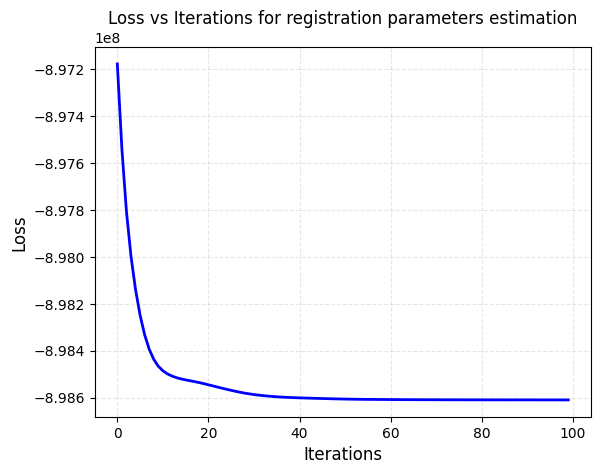

In [461]:
#visualize the loss

plt.plot(range(len(losses)), losses, color='blue', linestyle='-', linewidth=2, markersize=6)
plt.title("Loss vs Iterations for registration parameters estimation")
plt.xlabel("Iterations", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.3)
plt.savefig("loss_reg_estimation.jpg", dpi=100, bbox_inches="tight", format="jpg")
plt.show()

Compare the Results Estiamted with The ground Truth

In [436]:
for p in params:
    p.requires_grad = False

In [437]:
shifts_list_est_x = []
shifts_list_est_y = []
shifts_list_true_x = []
shifts_list_true_y = []
angles_list_est = []
angles_list_true = []

In [438]:
for k in range(K):

    s_est = shifts[k].data.cpu().numpy()
    s_true = shifts_true[k].data.cpu().numpy()

    print(f"Shifts | True: {s_true} | Estimated: {s_est}")

    shifts_list_est_x.append(s_est[0])
    shifts_list_est_y.append(s_est[1])

    shifts_list_true_x.append(s_true[0])
    shifts_list_true_y.append(s_true[1])

    a_true = angles_true[k].item()
    a_est = angles[k].item()

    print(f"Angles | True: {a_true:.4f} | Estimated: {a_est:.4f}\n")

    angles_list_est.append(a_est)
    angles_list_true.append(a_true)

print(f"Gamma | True Gamma: {gamma_true} | Estimated: {gamma:.4f}")

Shifts | True: [[ 0.5874642]
 [-1.478143 ]] | Estimated: [[ 0.6690107]
 [-1.7470542]]
Angles | True: -3.7430 | Estimated: -2.6696

Shifts | True: [[ 1.2587756]
 [-1.1486799]] | Estimated: [[ 1.1416932]
 [-1.0700568]]
Angles | True: 2.0485 | Estimated: 2.4589

Shifts | True: [[-1.8331305]
 [-0.6015636]] | Estimated: [[-1.8532369 ]
 [-0.66516805]]
Angles | True: -3.3262 | Estimated: -2.8739

Shifts | True: [[ 0.7893357 ]
 [-0.94700015]] | Estimated: [[ 0.85383046]
 [-1.097061  ]]
Angles | True: -2.5892 | Estimated: -2.1846

Shifts | True: [[-0.720654 ]
 [ 1.8316269]] | Estimated: [[-0.8548747]
 [ 2.139871 ]]
Angles | True: 3.4383 | Estimated: 2.6722

Shifts | True: [[1.9361353 ]
 [0.54583985]] | Estimated: [[1.957623  ]
 [0.50407463]]
Angles | True: -1.9189 | Estimated: -1.6785

Shifts | True: [[1.0116304]
 [1.8489782]] | Estimated: [[0.88288283]
 [2.0493128 ]]
Angles | True: 2.3667 | Estimated: 2.3201

Shifts | True: [[ 1.3002467]
 [-1.1190348]] | Estimated: [[ 1.1512139]
 [-1.1249022]]

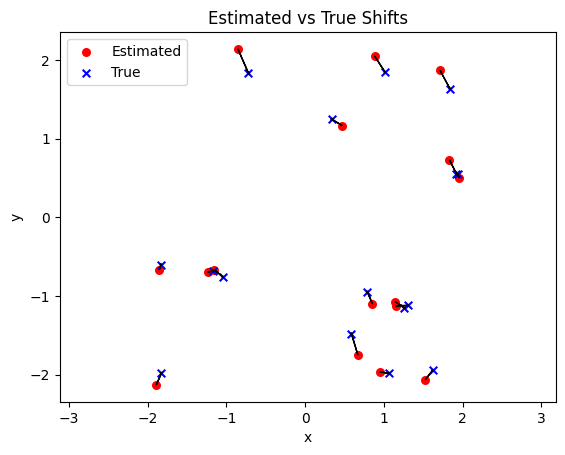

In [462]:
# Scatter plot for estimated and true shifts
plt.scatter(shifts_list_est_x, shifts_list_est_y, s=30, c="r")
plt.scatter(shifts_list_true_x, shifts_list_true_y, s=30, c="b", marker="x")

# Add arrows from estimated to true shifts
for est_x, est_y, true_x, true_y in zip(shifts_list_est_x, shifts_list_est_y, shifts_list_true_x, shifts_list_true_y):
    plt.arrow(est_x[0], est_y[0], true_x[0] - est_x[0], true_y[0] - est_y[0], head_width=0.03, head_length=0.01, fc='k', ec='k')


plt.axis("equal")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Estimated vs True Shifts")
plt.legend(["Estimated", "True"])
plt.savefig("estimated_shifts_with_arrows.jpg", dpi=100, bbox_inches="tight", format="jpg")
plt.show()


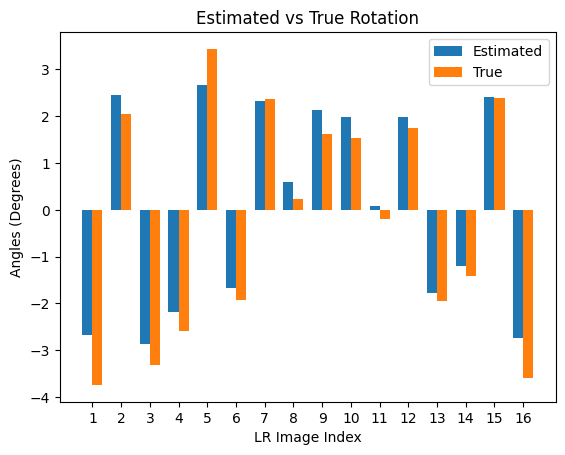

In [464]:
# Calculate absolute differences between estimated and true angles
angles_diffs = [abs(angles_list_est[k] - angles_list_true[k]) for k in range(K)]

# Define the width of the bars
bar_width = 0.35

# Set positions for the bars
index = np.arange(K)

# Plot the bars
plt.bar(index, angles_list_est, bar_width, label='Estimated')
plt.bar(index + bar_width, angles_list_true, bar_width, label='True')

# Add labels, title, and legend
plt.xlabel("LR Image Index")
plt.ylabel("Angles (Degrees)")
plt.title("Estimated vs True Rotation")
plt.xticks(index + bar_width / 2, range(1, K+1))
plt.legend()

# Save and show the plot
plt.savefig("estimated_angles.jpg", dpi=100, bbox_inches="tight", format="jpg")
plt.show()

In [443]:
torch.cuda.empty_cache()

## HR Image Estimation : Optimize the full posterior distribution over the high-resolution image

In [444]:
SHAPE_HR=SHAPE_HR_ORG
SHAPE_LR=SHAPE_LR_ORG

N = SHAPE_HR[0] * SHAPE_HR[1]
M = SHAPE_LR[0] * SHAPE_LR[1]

CENTER_HR = [dim//2 for dim in SHAPE_HR]
CENTER_HR = torch.tensor(CENTER_HR, dtype = torch.float).reshape(2, 1).to(device)

# Pre-compute v_hr for reuse
V_HR  = positions(SHAPE_HR)
V_LR  = UPSCALE_FACTOR * positions(SHAPE_LR)
V_HR2 = torch.sum(V_HR**2, axis = 0).reshape(1, -1) # [1, N]

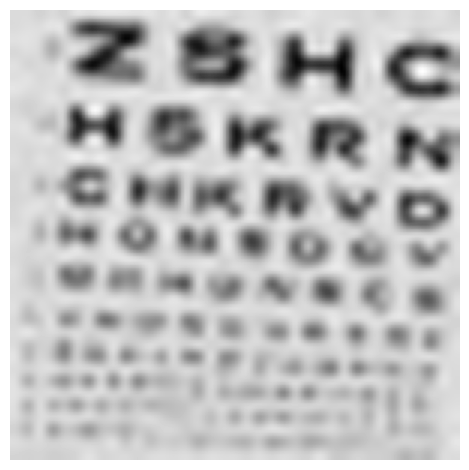

In [445]:
# Initial estimate for the HR image using bilinear interpolation method
X = y[0].reshape(SHAPE_LR)
X = X.data.cpu().numpy()
X = cv2.resize(X, (SHAPE_HR[1], SHAPE_HR[0]), interpolation = cv2.INTER_CUBIC)
disp(X, "sr_cubic.jpg")

In [446]:
torch.cuda.empty_cache()

In [447]:
#recalculate Zx
Zx = torch.empty(N, N, dtype = torch.float).to(device)
priorCovariance()
Zx_inv = torch.inverse(Zx)
logdet_Zx = logdetSPD(Zx)

del Zx
torch.cuda.empty_cache()

In [448]:
#Set gradient voer the high resolution image to be updated uring optimization
X = X.reshape(N, 1)
X = torch.tensor(X, dtype = torch.float).to(device)
X = scale(X)
X.requires_grad = True

In [449]:
#The Initial PSNR and RMSE
print("Initial PSNR: {:.3f}".format(PSNR(img, X).item()))
print("Initial RMSE: {:.3f}".format(RMSE(img, X).item()))

Initial PSNR: 9.131
Initial RMSE: 0.350


In [450]:
#Calculate the full transformation matrix obtained from the prvious optimization to be fixed
W = [transform(shifts[k], angles[k], gamma) for k in range(K)]

In [451]:
#Define the hyper parameters
N_EPOCH_MAX = 100 #number of epochs
LR = 0.05 #learning rate
PRIOR2 = "GP" #type of prioir
optimizer = torch.optim.Adam(
    [X],
    lr = LR
)

  0%|          | 0/100 [00:00<?, ?it/s]

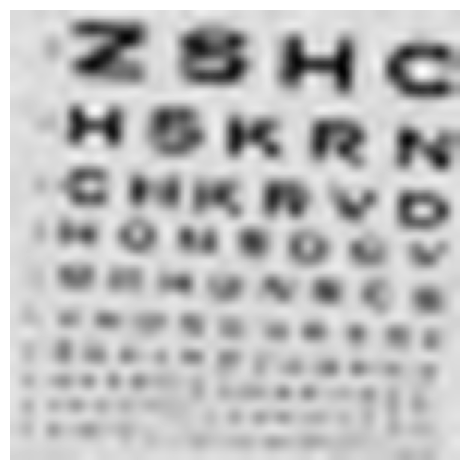

Loss: -897178240.0000
Loss: -897540160.0000


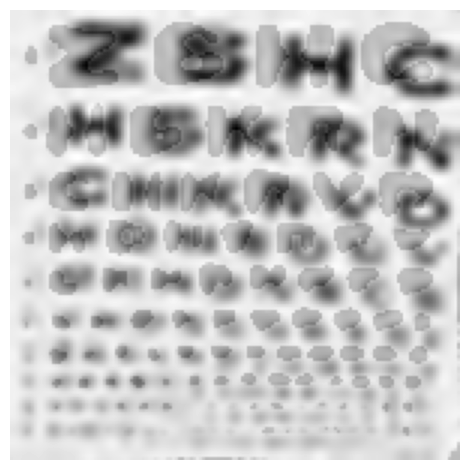

Loss: -897806208.0000
Loss: -897997696.0000


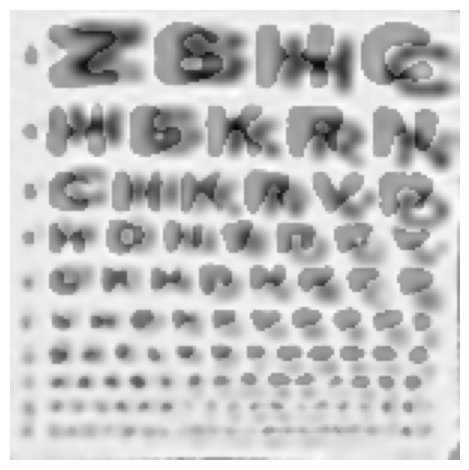

Loss: -898139968.0000
Loss: -898249152.0000


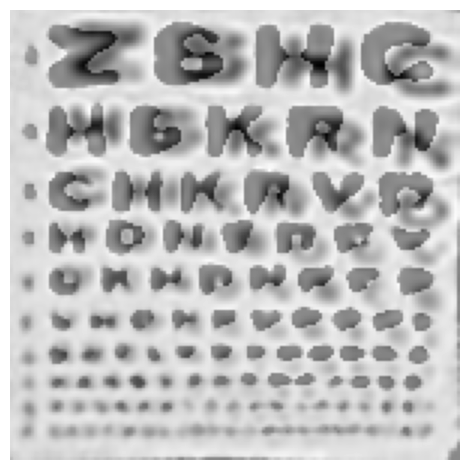

Loss: -898332608.0000
Loss: -898394112.0000


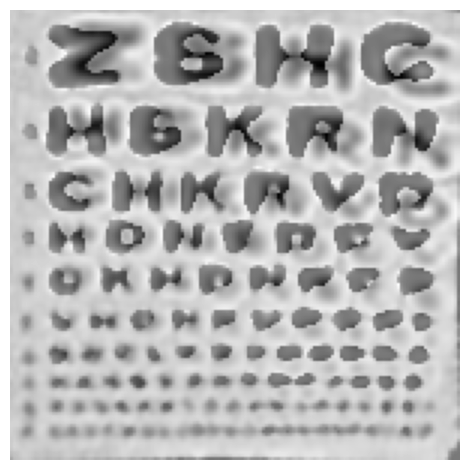

Loss: -898437376.0000
Loss: -898466560.0000


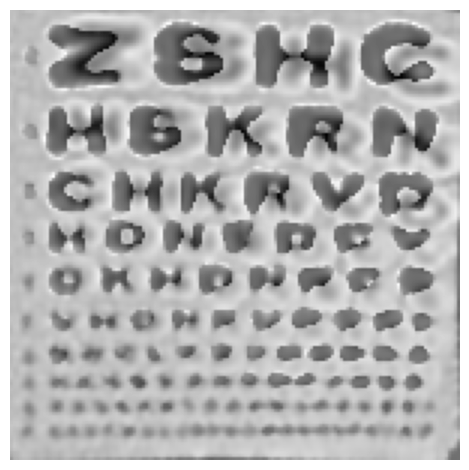

Loss: -898485952.0000
Loss: -898499200.0000


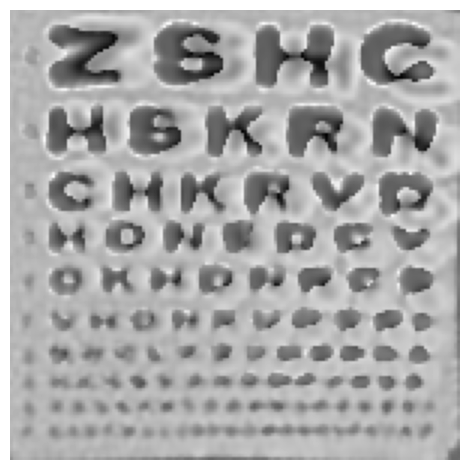

Loss: -898508480.0000
Loss: -898515392.0000


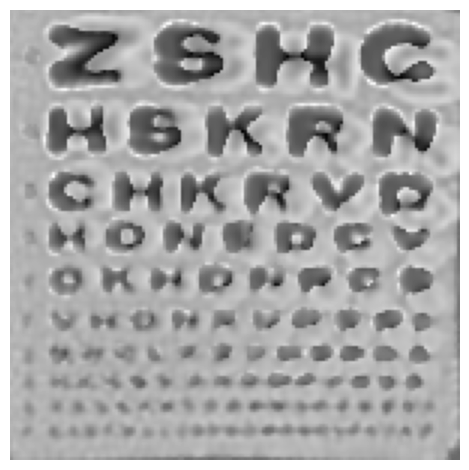

Loss: -898520640.0000
Loss: -898524864.0000


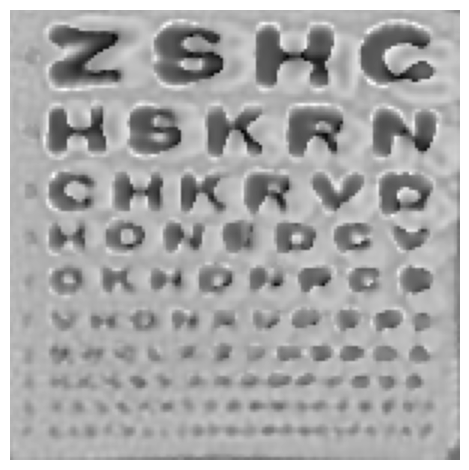

Loss: -898528576.0000
Loss: -898532288.0000


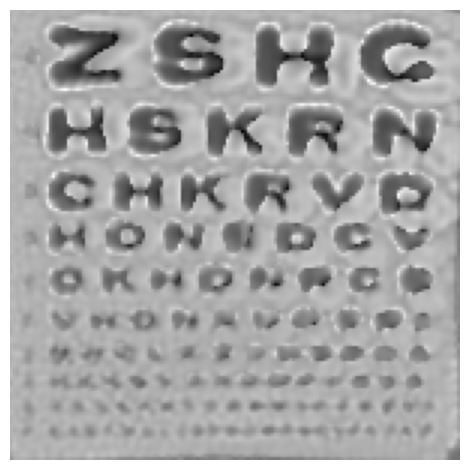

Loss: -898536384.0000
Loss: -898540928.0000


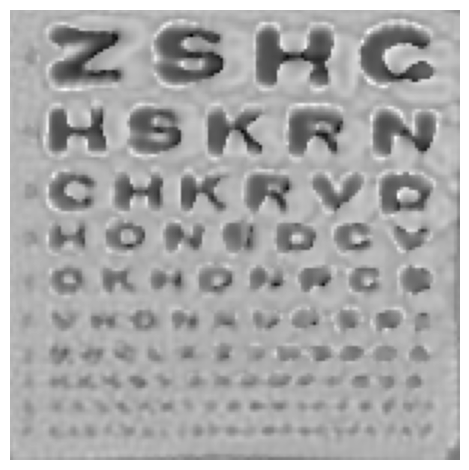

Loss: -898545728.0000
Loss: -898550592.0000


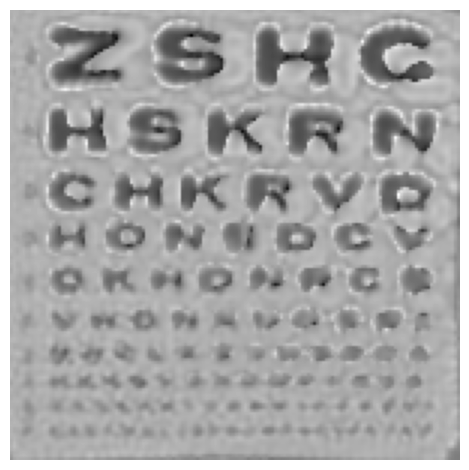

Loss: -898555456.0000
Loss: -898560256.0000


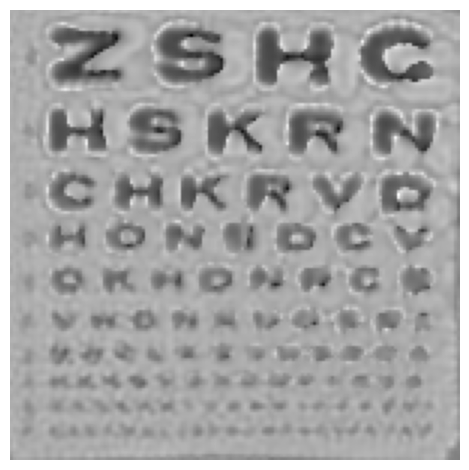

Loss: -898564864.0000
Loss: -898569344.0000


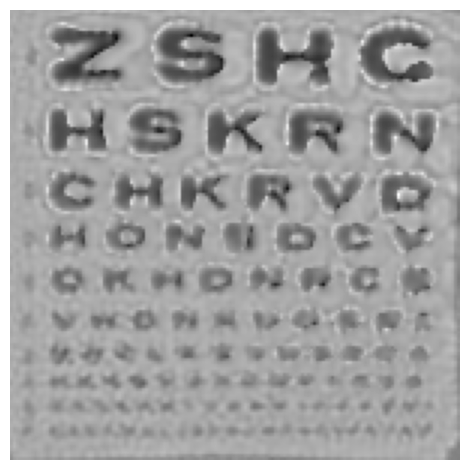

Loss: -898573632.0000
Loss: -898577664.0000


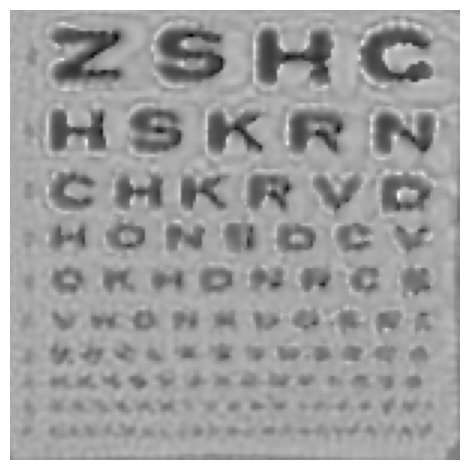

Loss: -898581312.0000
Loss: -898584512.0000


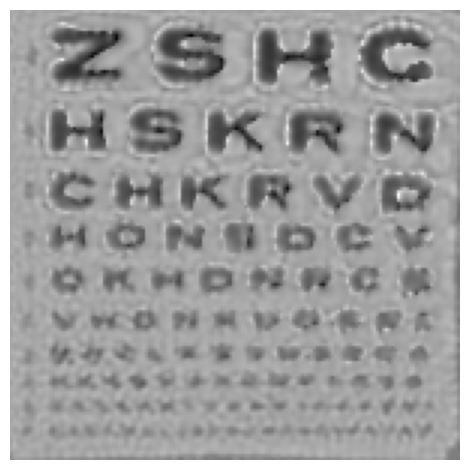

Loss: -898587392.0000
Loss: -898589760.0000


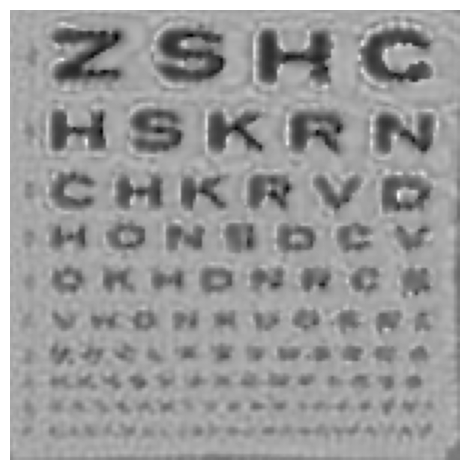

Loss: -898591872.0000
Loss: -898593728.0000


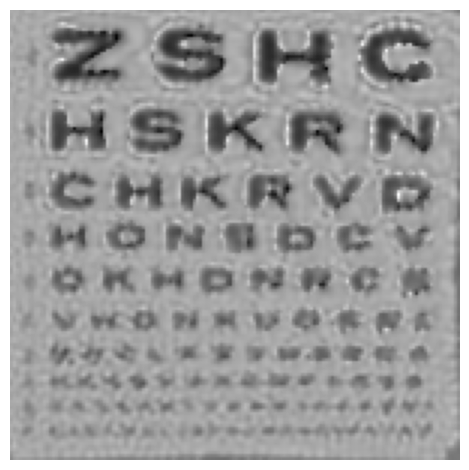

Loss: -898595328.0000
Loss: -898596736.0000


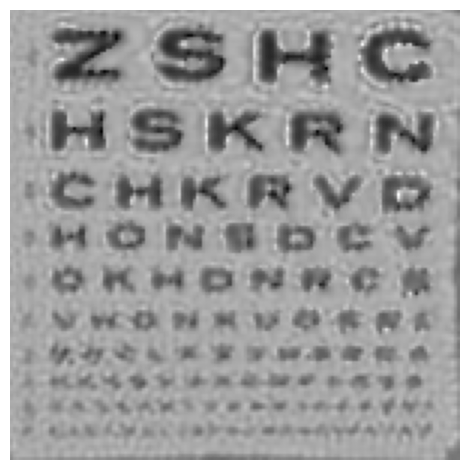

Loss: -898598016.0000
Loss: -898598976.0000


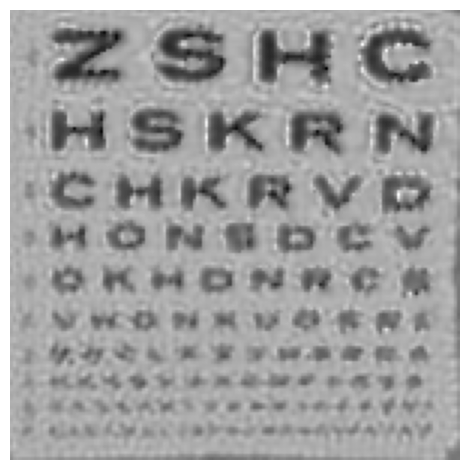

Loss: -898599872.0000
Loss: -898600704.0000


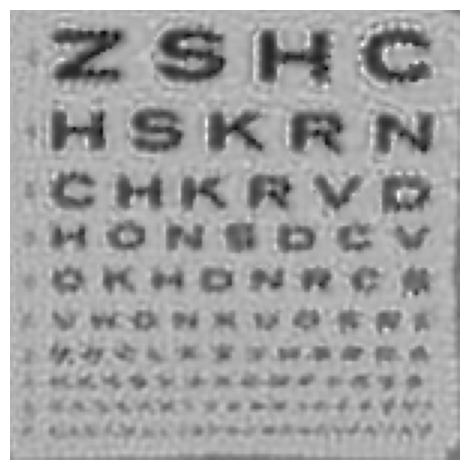

Loss: -898601408.0000
Loss: -898601984.0000


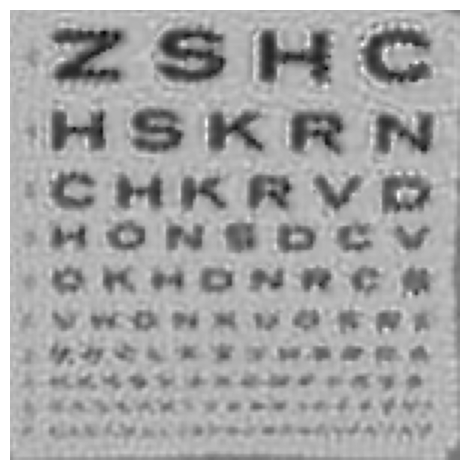

Loss: -898602560.0000
Loss: -898603136.0000


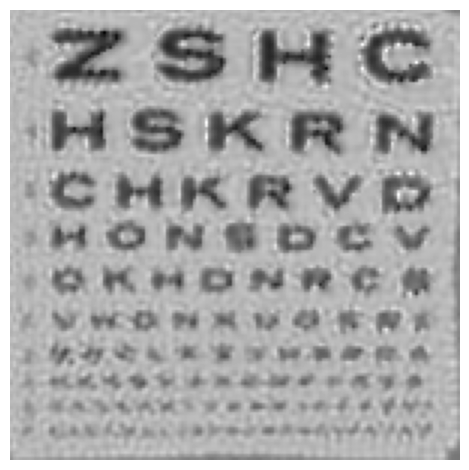

Loss: -898603712.0000
Loss: -898604224.0000


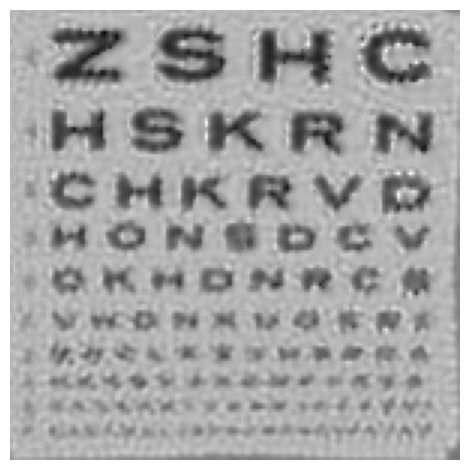

Loss: -898604736.0000
Loss: -898605184.0000


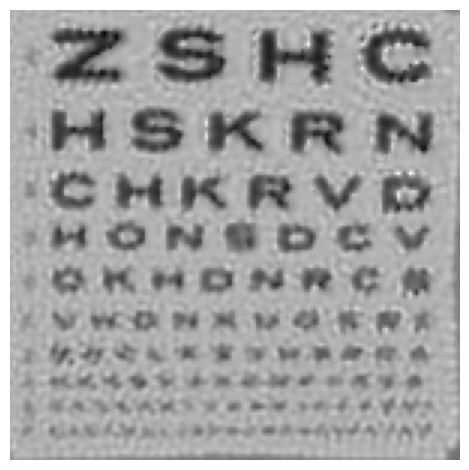

Loss: -898605696.0000
Loss: -898606144.0000


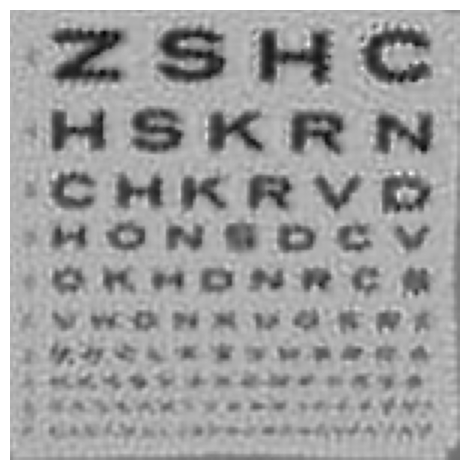

Loss: -898606528.0000
Loss: -898606912.0000


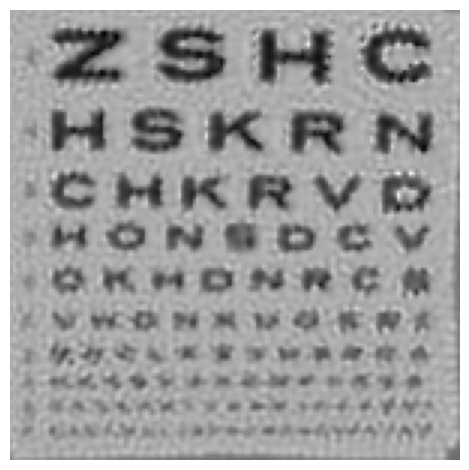

Loss: -898607232.0000
Loss: -898607488.0000


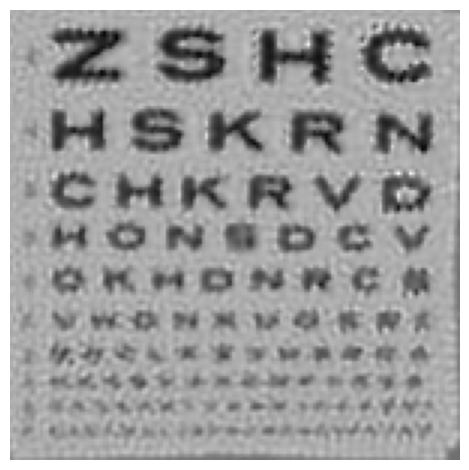

Loss: -898607744.0000
Loss: -898607936.0000


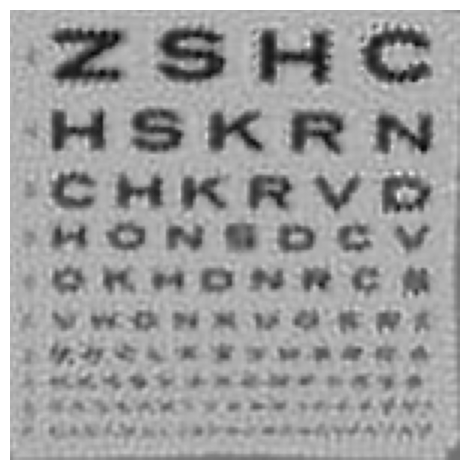

Loss: -898608000.0000
Loss: -898608192.0000


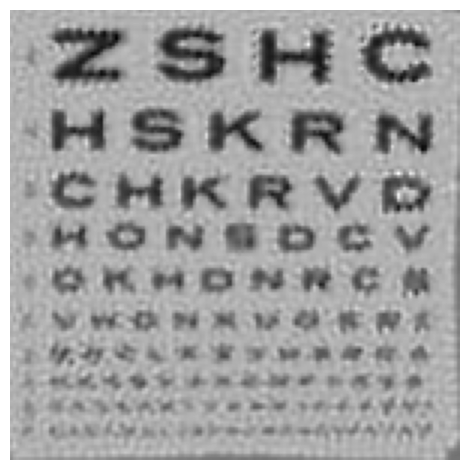

Loss: -898608320.0000
Loss: -898608448.0000


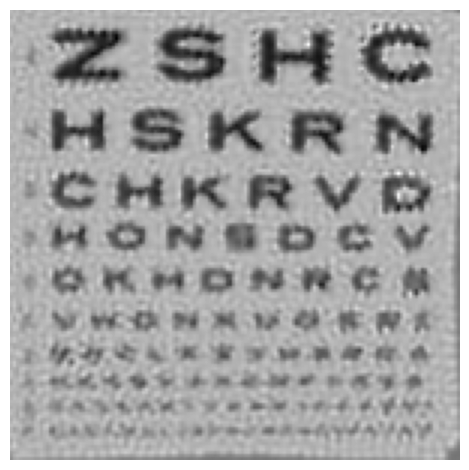

Loss: -898608640.0000
Loss: -898608768.0000


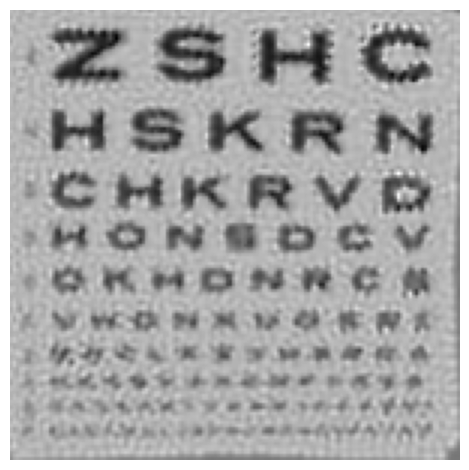

Loss: -898608832.0000
Loss: -898608960.0000


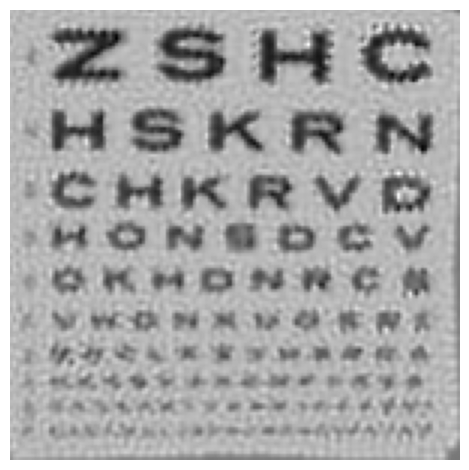

Loss: -898609088.0000
Loss: -898609152.0000


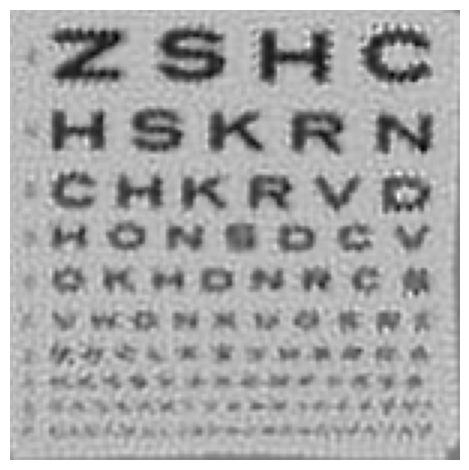

Loss: -898609216.0000
Loss: -898609344.0000


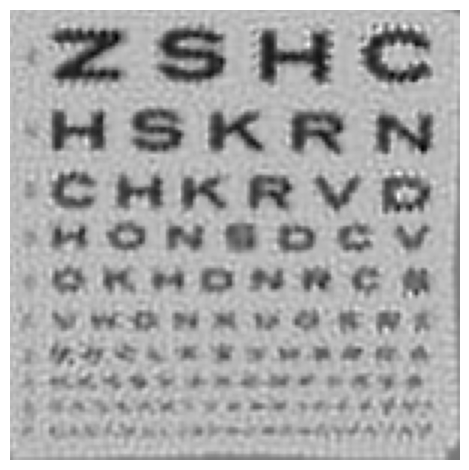

Loss: -898609408.0000
Loss: -898609408.0000


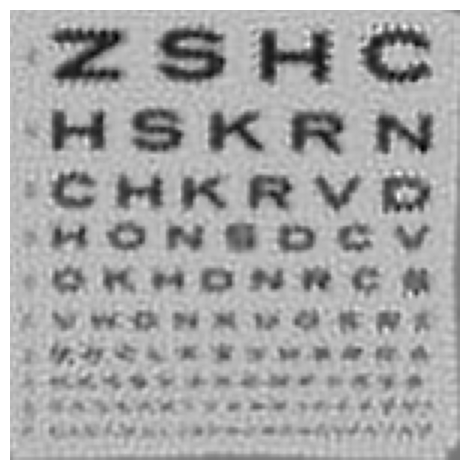

Loss: -898609472.0000
Loss: -898609536.0000


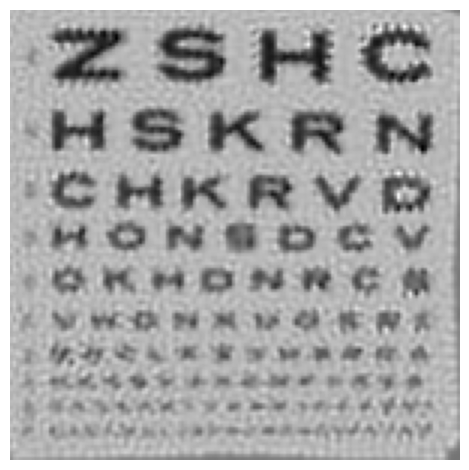

Loss: -898609600.0000
Loss: -898609600.0000


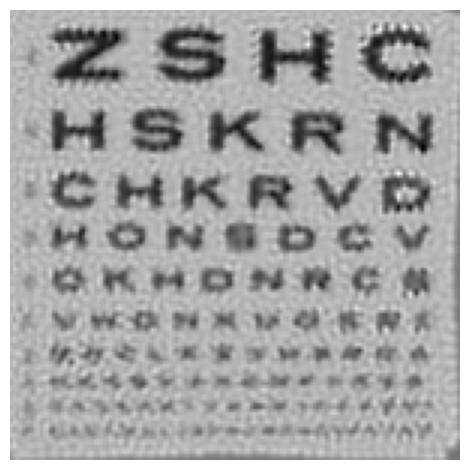

Loss: -898609664.0000
Loss: -898609728.0000


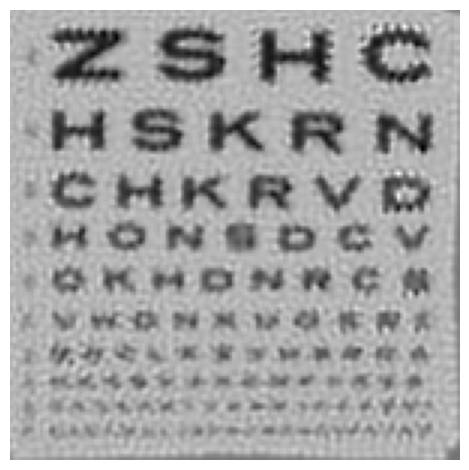

Loss: -898609728.0000
Loss: -898609792.0000


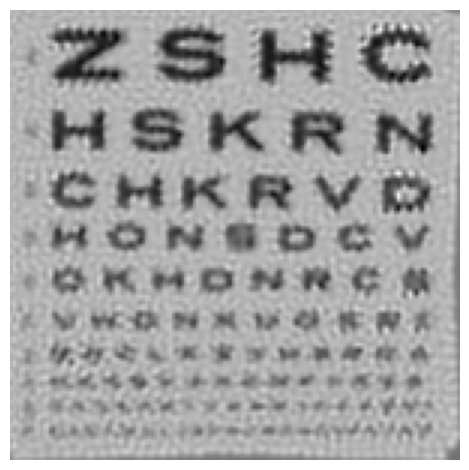

Loss: -898609792.0000
Loss: -898609856.0000


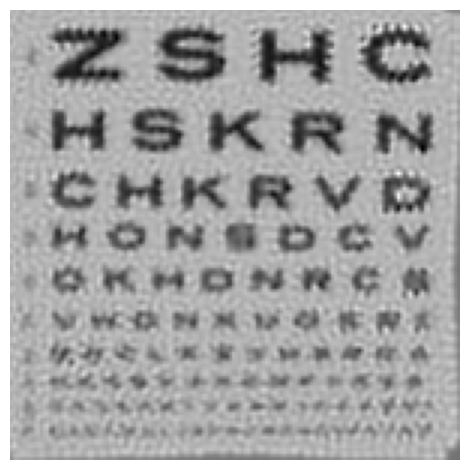

Loss: -898609856.0000
Loss: -898609920.0000


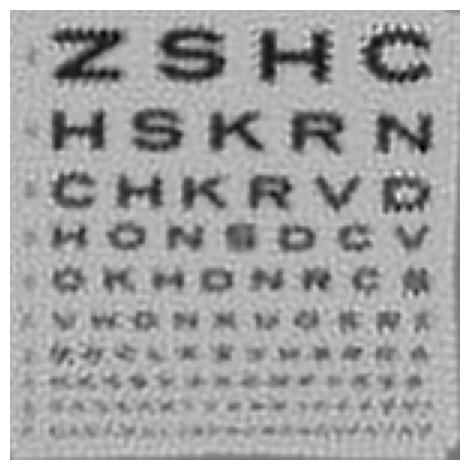

Loss: -898609920.0000
Loss: -898609920.0000


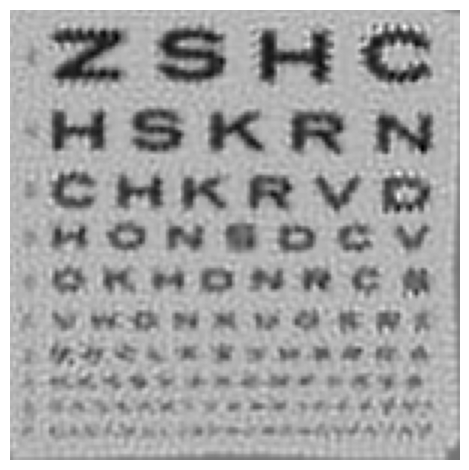

Loss: -898609984.0000
Loss: -898609984.0000


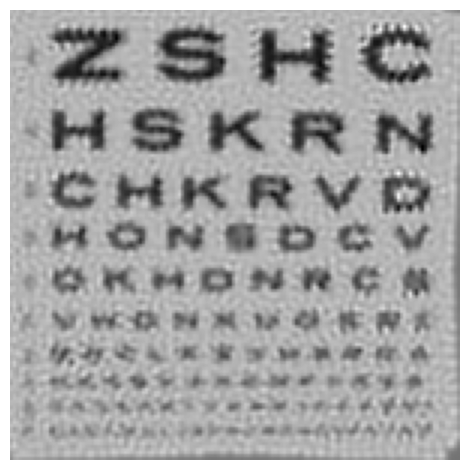

Loss: -898610048.0000
Loss: -898610048.0000


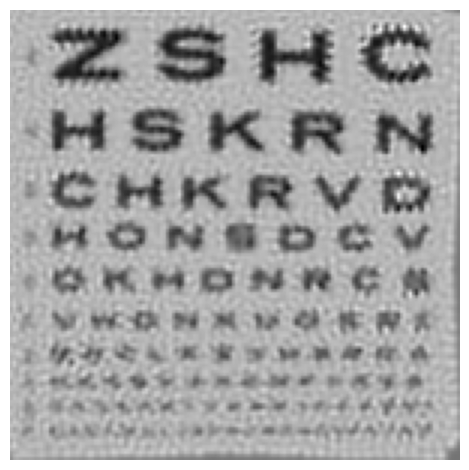

Loss: -898609984.0000
Loss: -898610048.0000


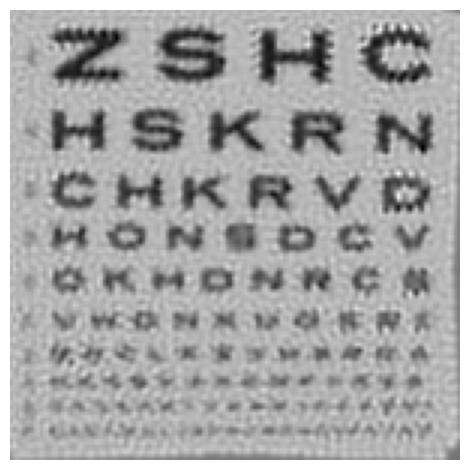

Loss: -898610048.0000
Loss: -898610048.0000


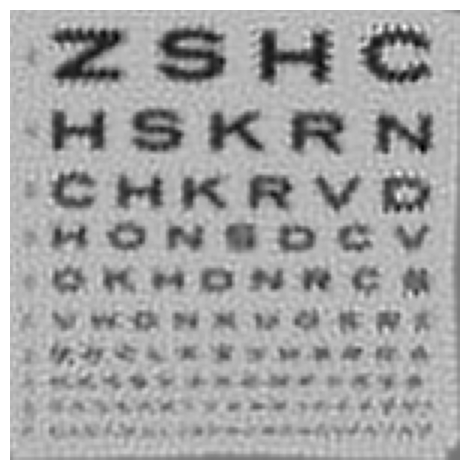

Loss: -898610048.0000
Loss: -898610112.0000


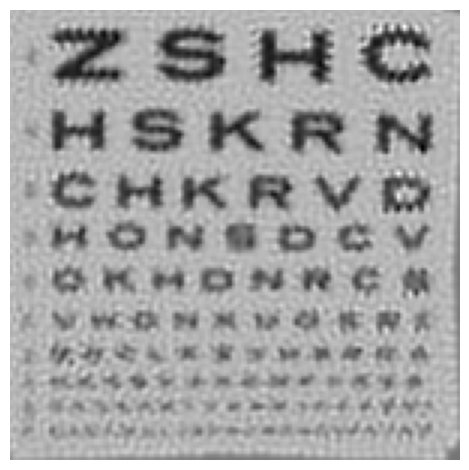

Loss: -898610112.0000
Loss: -898610112.0000


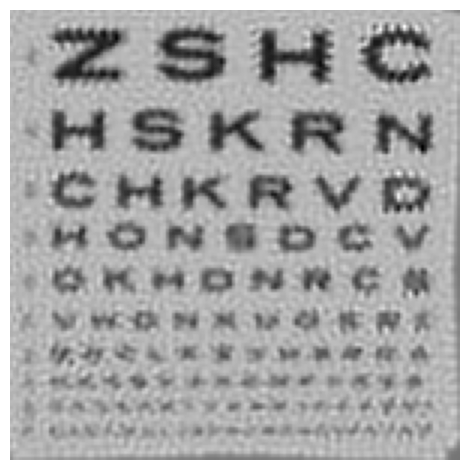

Loss: -898610112.0000
Loss: -898610112.0000


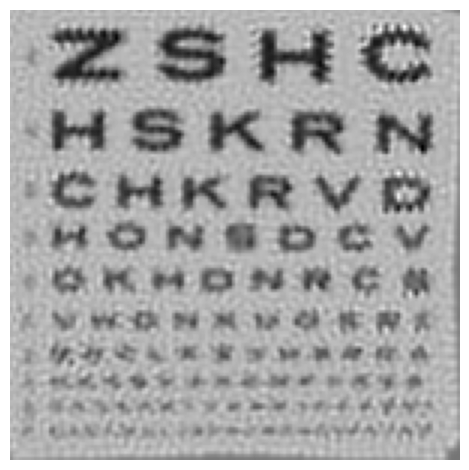

Loss: -898610176.0000
Loss: -898610176.0000


In [452]:
#Traing loop
losses = []
for i in tqdm(range(N_EPOCH_MAX)):

    if i % 2 == 0:
        disp(X.reshape(SHAPE_HR), f"GIF/{i}.jpg")
    optimizer.zero_grad()
    torch.cuda.empty_cache()
    if PRIOR2 == "MRF":
        loss = -1*logPosteriorMRF(X, y, W, SIGMA_AGN)
    elif PRIOR2 == "GP":
        loss = -1*logPosteriorGaussian(X, y, W, SIGMA_AGN)

    loss.backward()
    torch.cuda.empty_cache()
    optimizer.step()
    loss_scalar = loss.item()
    losses.append(loss_scalar)
    print(f"Loss: {loss_scalar:.4f}")
    torch.cuda.empty_cache()

In [453]:
X.requires_grad = False #Deactivate the loss

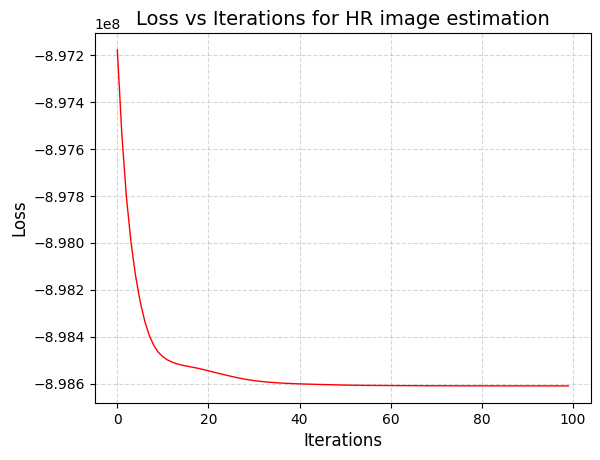

In [455]:
plt.plot(range(len(losses)), losses, color='red', linewidth=1, markersize=2)

# Customize labels, title, and ticks
plt.xlabel("Iterations", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.title("Loss vs Iterations for HR image estimation", fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Add grid
plt.grid(True, linestyle='--', alpha=0.5)

# Save and show the plot
plt.savefig("loss_hr_estimation.jpg", dpi=100, bbox_inches="tight", format="jpg")
plt.show()

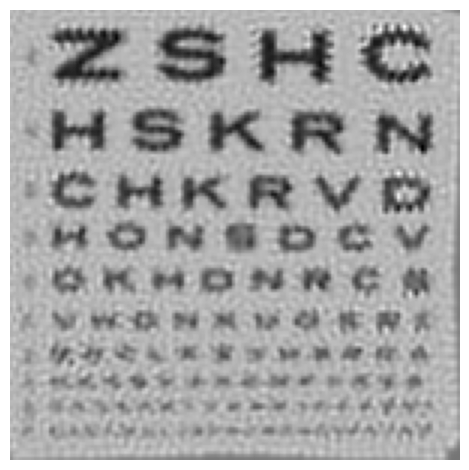

In [456]:
disp(X.reshape(SHAPE_HR))

In [457]:
print("Final PSNR achieved: {:.3f}".format(PSNR(img, X).item()))
print("Final RMSE achieved: {:.3f}".format(RMSE(img, X).item()))

Final PSNR achieved: 10.590
Final RMSE achieved: 0.164


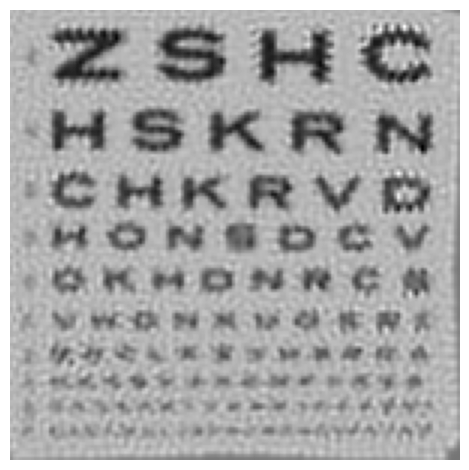

In [458]:
#final result
disp(X.reshape(SHAPE_HR), "GIF/100.jpg")